In [1]:
import tifffile as tf
import matplotlib.pylab as plt
import numpy as np
import pandas as pd
import visualize as vis
import dict_learning as dl
import spectral_cluster as sc
from utils import bm_utils as bmu
from utils import util
from create_corr_kern import create_corr_kern
import cv2

RAPIDS CUDA acceleration enabled


/home/tony/miniconda3/envs/rapids-25.08/lib/python3.13/site-packages/cupyx/jit/_interface.py:173: FutureWarning: cupyx.jit.rawkernel is experimental. The interface can change in the future.
  cupy._util.experimental('cupyx.jit.rawkernel')


In [2]:
mask = cv2.imread('/mnt/team/TM_Lab/Tony/wr_new/data_used/mask.png',cv2.IMREAD_GRAYSCALE)
valid_pixels = mask[:182,:136].flatten().astype(bool)
valid_pixels=valid_pixels.reshape(182,136)
config = 'config.yaml'
config = util.load_config(config)
minKNN,maxKNN = (1000,3000) # targer sparsity for corr_kern
max_it = 10
self_tune = 10

In [3]:
# loading allen ccf coordinates and contours
ccf_path = '/home/tony/codesave/graft/GraFT-analysis/code/mask_imx296.csv'
contour_coords = util.extract_contour_coords(ccf_path)
df = pd.read_csv(ccf_path)
df = df[(df['left_center'] != "(None, None)") & (df['right_center'] != "(None, None)")]
df = df.reset_index()


In [4]:
# loading widefield cortical of TTA-gcamp8s mouse
data_archive = np.load('brain_data.npz')
gcamps_concat = data_archive['gcamps']
hemos_concat = data_archive['hemos']
gsplit = data_archive['gcamp_indices']
hemo_indices = data_archive['hemo_indices']

Shape of GCaMP data (nframes, height,width): (24274, 182, 136)
Shape of Hemo data (nframes, height,width): (24326, 182, 136)


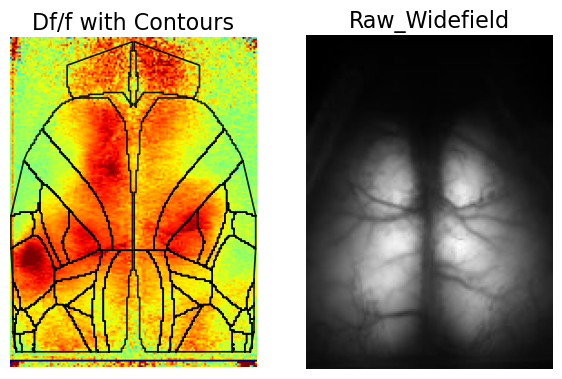

In [5]:
fig, axes = plt.subplots(1, 2, figsize=(7, 7))
# Left plot: GCaMP with contours
axes[0].imshow(gcamps_concat[156,:,:], cmap='jet', vmin=-0.1, vmax=0.1)
for x_coords, y_coords in contour_coords:
    x_coords = [int(x) for x in x_coords]
    y_coords = [int(y) for y in y_coords]
    axes[0].plot(x_coords, y_coords, linewidth=1.2, color='black', alpha=0.9)
axes[0].axis('off')
axes[0].set_title('Df/f with Contours', fontsize=16)
img = cv2.imread('brain_sample.jpg')
axes[1].imshow(img)
axes[1].axis('off')
axes[1].set_title('Raw_Widefield', fontsize=16)
print('Shape of GCaMP data (nframes, height,width):', gcamps_concat.shape)
print('Shape of Hemo data (nframes, height,width):', hemos_concat.shape)

In [6]:
# remove global signals /trends
#gcamps_concat[np.isnan(gcamps_concat)] = 1e-10
gcamps = bmu.highpass_detrend_trials(gcamps_concat, gsplit,fs=27,highpass=0.1, degree=0).get()
#hemos_concat[np.isnan(hemos_concat)] = 1e-10
hemos = bmu.highpass_detrend_trials(hemos_concat, gsplit,fs=27,highpass=0.1, degree=0).get()

In [7]:
%%time
# depend on GPU memory, adjust minKNN, maxKNN accordingly, with my current dataset and KNN settings, it requires approx 17gb
kernel = create_corr_kern()
kNN_gcamp, sparsity_gcamp, kernel_gcamp =kernel.estimate_knn_for_sparsity(gcamps,self_tune=self_tune,
                                                                          max_iter=max_it,min_k=minKNN,
                                                                          max_k=maxKNN,use_cuda=True,
                                                                          target_sparsity_percent=10.0)
kNN_hemo, sparsity_gcamp, kernel_hemo =kernel.estimate_knn_for_sparsity(hemos,self_tune=self_tune,
                                                                          max_iter=max_it,min_k=minKNN,
                                                                          max_k=maxKNN,use_cuda=True,
                                                                          target_sparsity_percent=10.0)


[Iter 1] Trying kNN = 2000...
→ Sparsity: 10.3738% | Target: 10.0% | Δ = 0.3738
✅ Found acceptable kNN!

[Iter 1] Trying kNN = 2000...
→ Sparsity: 11.9268% | Target: 10.0% | Δ = 1.9268

[Iter 2] Trying kNN = 1499...
→ Sparsity: 8.9498% | Target: 10.0% | Δ = 1.0502

[Iter 3] Trying kNN = 1749...
→ Sparsity: 10.4354% | Target: 10.0% | Δ = 0.4354
✅ Found acceptable kNN!
CPU times: user 1min 2s, sys: 26 s, total: 1min 28s
Wall time: 1min 28s


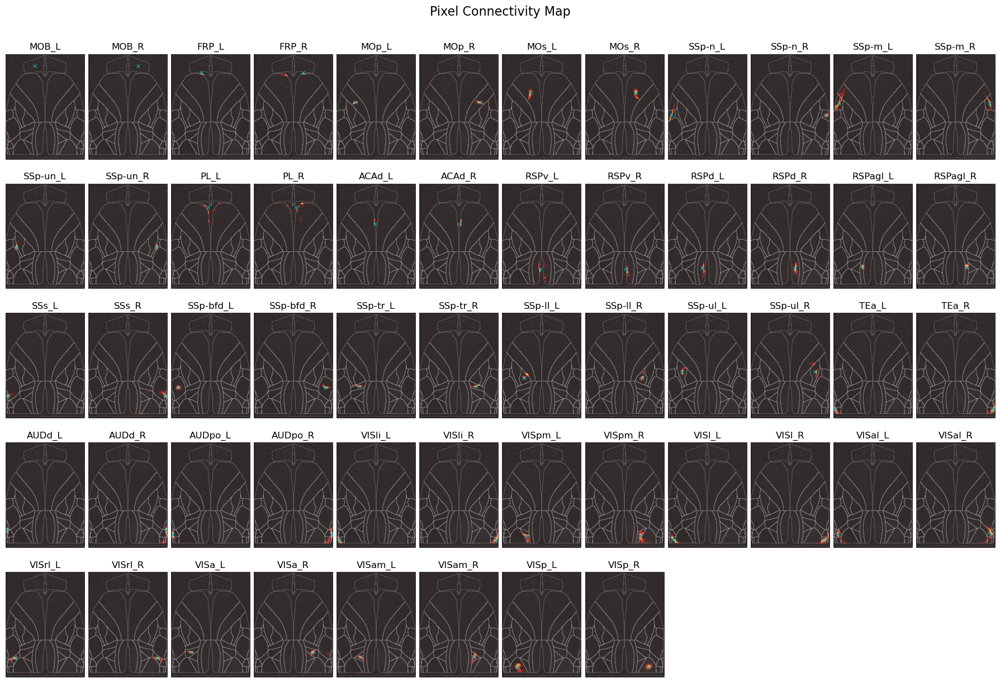

In [8]:
# CREATE THE PLOTTING GRID AND VISUALIZE ---
num_regions = len(df)

cols_per_row = 6  # Number of regions per row
num_cols = cols_per_row * 2  
num_rows = int(np.ceil(num_regions / cols_per_row))
fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 2.5 * num_rows), squeeze=False)
fig.suptitle('Pixel Connectivity Map', fontsize=16, y=0.995)

last_im = None

for i, row in df.iterrows():
    region_name = row['acronym']
    left_coord_str = row['left_center']
    right_coord_str = row['right_center']
    
    # Calculate which row and column this region should appear in
    grid_row = i // cols_per_row
    grid_col_start = (i % cols_per_row) * 2
    
    ax_left = axes[grid_row, grid_col_start]
    ax_right = axes[grid_row, grid_col_start + 1]

    # --- Visualize Left Center ---
    left_coords = util.parse_coords(left_coord_str)
    if left_coords:
        title = f'{region_name}_L'
        vis.visualize_overlay_connectivity(gcamps[10, :, :], kernel_gcamp, left_coords,
                                       valid_pixels, ax_left,contour_coords, title_prefix=title)
    else:
        ax_left.axis('off')

    # --- Visualize Right Center ---
    right_coords = util.parse_coords(right_coord_str)
    if right_coords:
        title = f'{region_name}_R'
        im = vis.visualize_overlay_connectivity(gcamps[10, :,:], kernel_gcamp, right_coords,
                                            valid_pixels, ax_right,contour_coords, title_prefix=title)
        if im: last_im = im
    else:
        ax_right.axis('off')
# Hide any unused subplots
total_plots_needed = num_regions * 2
for idx in range(total_plots_needed, num_rows * num_cols):
    row_idx = idx // num_cols
    col_idx = idx % num_cols
    axes[row_idx, col_idx].axis('off')
# --- D. FINALIZE AND SHOW THE PLOT ---
plt.tight_layout(rect=[0, 0, 1, 0.99], h_pad=0.5, w_pad=0.5)

In [16]:
%time

params = {
    'n_atoms':int(28*2)+2, # N atoms on ccf 
    'numreps': 2,
    'tau': 1.0,
    'beta': 0.05,
    'lambda': 0.4,    
    'lamCont': 0.6,
    'lamCorr': 0.8,
    'nonneg': False,
    'max_learn': 300,
    'learn_eps': 0.015,
    'batch_size': int(16384*2),
}
# Initialize dictionary
D_init = np.random.randn(gcamps.shape[0], params['n_atoms']).astype(np.float32)
D_init /= np.linalg.norm(D_init, axis=0)

# Run GPU-accelerated GraFT
print("\n" + "="*70)
print("Starting GPU-Accelerated GraFT Algorithm")

gcamps[:, ~valid_pixels] = 0


D_final, S_final, dict_evo = dl.graft_gpu(gcamps, D_init, kernel_gcamp, params)

print(f"\n{'='*70}")
print(f"{'='*70}")
print(f"Final Dictionary Shape: {D_final.shape}")
print(f"Final Spatial Maps Shape: {S_final.shape}")


CPU times: user 1e+03 ns, sys: 1e+03 ns, total: 2 μs
Wall time: 3.81 μs

Starting GPU-Accelerated GraFT Algorithm
Transferring data to GPU...
Using Advanced Regularization: lamCont=0.6, lamCorr=0.8

--- GraFT GPU Iteration 1/300 ---
Step 1: Inferring sparse activity maps on GPU...
  RWL1SF Iteration 1/2
    Solving weighted LASSO on GPU...
  RWL1SF Iteration 2/2
    Updating penalty weights with graph filtering...
    Solving weighted LASSO on GPU...
Step 2: Updating dictionary on GPU with advanced regularization...
Relative change in dictionary: 1.368911

--- GraFT GPU Iteration 2/300 ---
Step 1: Inferring sparse activity maps on GPU...
  RWL1SF Iteration 1/2
    Solving weighted LASSO on GPU...
  RWL1SF Iteration 2/2
    Updating penalty weights with graph filtering...
    Solving weighted LASSO on GPU...
Step 2: Updating dictionary on GPU with advanced regularization...
Relative change in dictionary: 0.325232

--- GraFT GPU Iteration 3/300 ---
Step 1: Inferring sparse activity maps 

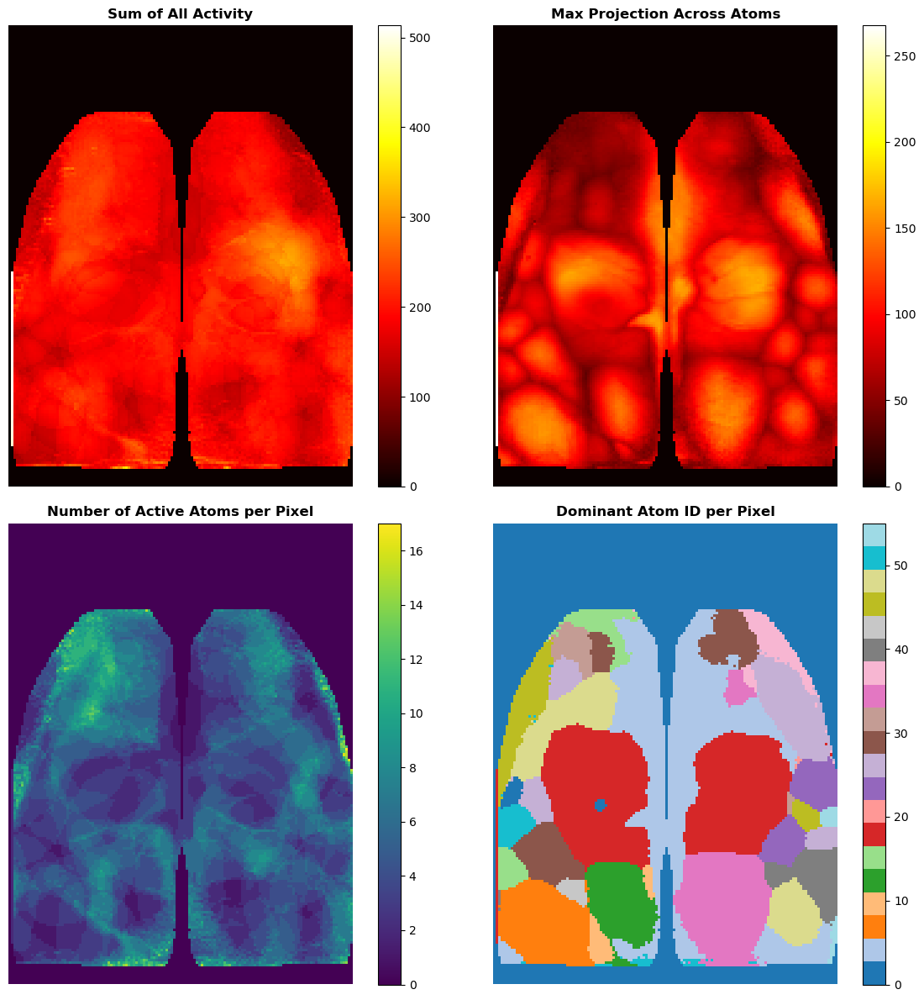

In [17]:
_= vis.create_composite_maps(S_final)

(<Figure size 1800x3000 with 116 Axes>,
 array([18,  3, 35,  8, 25, 12, 28, 29, 48, 15, 44, 47,  2, 50, 40, 34, 27,
        32,  5, 37, 33, 23, 24, 10, 49, 57, 51, 36, 43,  0, 21, 45,  9, 30,
        56, 42, 16, 52, 11, 39,  7, 26,  1, 38, 46, 53, 19, 54, 22, 17, 13,
        31, 14, 20,  4, 55]))

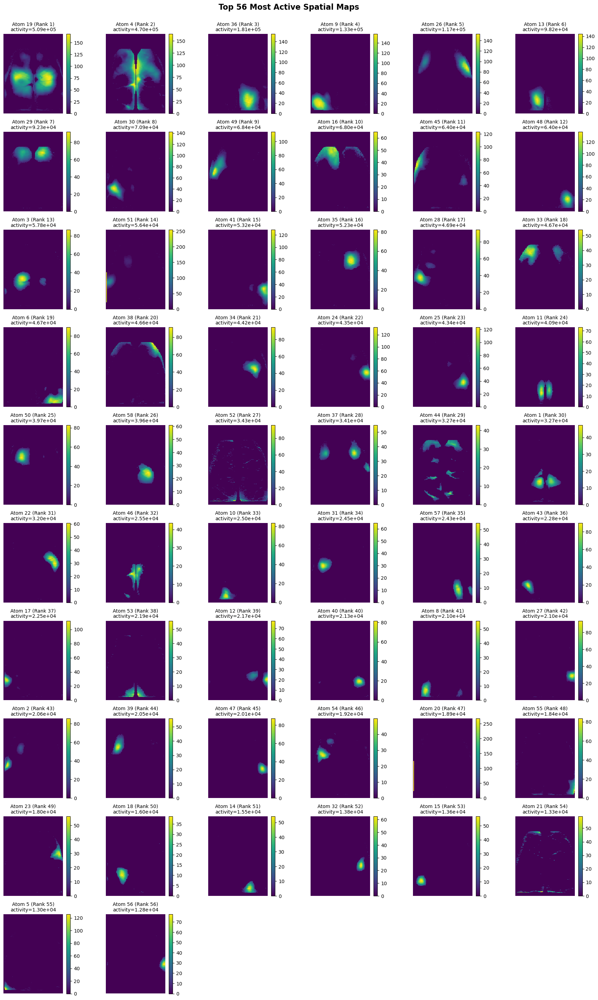

In [19]:
vis.visualize_top_atoms(S_final, n_top=int(28*2), n_cols=6)

Reconstructing data...
  2/58 atoms: R² = 48.94%
  4/58 atoms: R² = 58.71%
  6/58 atoms: R² = 63.76%
  8/58 atoms: R² = 66.06%
  10/58 atoms: R² = 70.30%
  12/58 atoms: R² = 72.79%
  14/58 atoms: R² = 74.28%
  16/58 atoms: R² = 77.11%
  18/58 atoms: R² = 77.67%
  20/58 atoms: R² = 78.48%
  22/58 atoms: R² = 80.14%
  24/58 atoms: R² = 80.09%
  26/58 atoms: R² = 80.64%
  28/58 atoms: R² = 81.30%
  30/58 atoms: R² = 81.86%
  32/58 atoms: R² = 81.92%
  34/58 atoms: R² = 81.86%
  36/58 atoms: R² = 82.05%
  38/58 atoms: R² = 82.00%
  40/58 atoms: R² = 81.94%
  42/58 atoms: R² = 82.10%
  44/58 atoms: R² = 82.45%
  46/58 atoms: R² = 82.93%
  48/58 atoms: R² = 82.93%
  50/58 atoms: R² = 83.13%
  52/58 atoms: R² = 83.30%
  54/58 atoms: R² = 83.49%
  56/58 atoms: R² = 83.39%
  58/58 atoms: R² = 83.45%


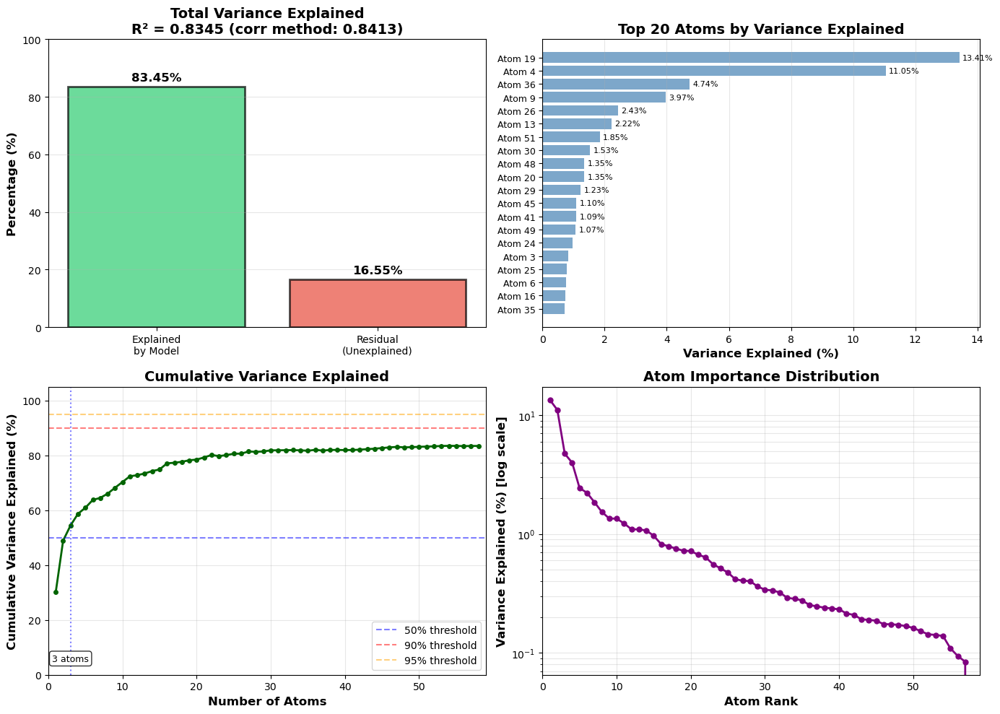

In [20]:
results = dl.calculate_variance_explained_gpu(gcamps, D_final, S_final, valid_pixels)
#dl.print_variance_summary(results, n_top=10)
_=vis.plot_variance_explained(results, n_top=20)

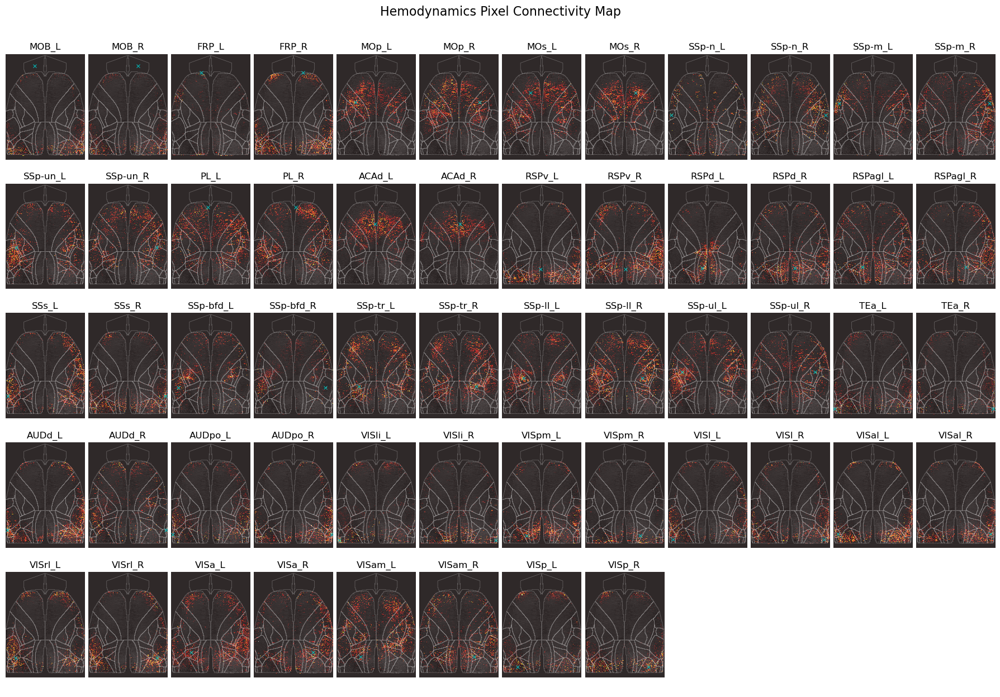

In [22]:
# CREATE THE PLOTTING GRID AND VISUALIZE ---
num_regions = len(df)

cols_per_row = 6  # Number of regions per row
num_cols = cols_per_row * 2  
num_rows = int(np.ceil(num_regions / cols_per_row))
fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 2.5 * num_rows), squeeze=False)
fig.suptitle('Hemodynamics Pixel Connectivity Map', fontsize=16, y=0.995)

last_im = None

for i, row in df.iterrows():
    region_name = row['acronym']
    left_coord_str = row['left_center']
    right_coord_str = row['right_center']
    
    # Calculate which row and column this region should appear in
    grid_row = i // cols_per_row
    grid_col_start = (i % cols_per_row) * 2
    
    ax_left = axes[grid_row, grid_col_start]
    ax_right = axes[grid_row, grid_col_start + 1]

    # --- Visualize Left Center ---
    left_coords = util.parse_coords(left_coord_str)
    if left_coords:
        title = f'{region_name}_L'
        vis.visualize_overlay_connectivity(gcamps[10, :, :], kernel_hemo, left_coords,
                                       valid_pixels, ax_left,contour_coords, title_prefix=title)
    else:
        ax_left.axis('off')

    # --- Visualize Right Center ---
    right_coords = util.parse_coords(right_coord_str)
    if right_coords:
        title = f'{region_name}_R'
        im = vis.visualize_overlay_connectivity(gcamps[10, :,:], kernel_hemo, right_coords,
                                            valid_pixels, ax_right,contour_coords, title_prefix=title)
        if im: last_im = im
    else:
        ax_right.axis('off')
# Hide any unused subplots
total_plots_needed = num_regions * 2
for idx in range(total_plots_needed, num_rows * num_cols):
    row_idx = idx // num_cols
    col_idx = idx % num_cols
    axes[row_idx, col_idx].axis('off')
# --- D. FINALIZE AND SHOW THE PLOT ---
plt.tight_layout(rect=[0, 0, 1, 0.99], h_pad=0.5, w_pad=0.5)

In [26]:
%time

params = {
    'n_atoms':int(28*2)+2, # N atoms on ccf 
    'numreps': 2,
    'tau': 1.0,
    'beta': 0.05,
    'lambda': 0.4,    
    'lamCont': 0.6,
    'lamCorr': 0.8,
    'nonneg': False,
    'max_learn': 300,
    'learn_eps': 0.015,
    'batch_size': int(16384*2),
}
# Initialize dictionary
D_init = np.random.randn(hemos.shape[0], params['n_atoms']).astype(np.float32)
D_init /= np.linalg.norm(D_init, axis=0)

# Run GPU-accelerated GraFT
print("\n" + "="*70)
print("Starting GPU-Accelerated GraFT Algorithm")

gcamps[:, ~valid_pixels] = 0


D_final, S_final, dict_evo = dl.graft_gpu(hemos, D_init, kernel_hemo, params)

print(f"\n{'='*70}")
print(f"{'='*70}")
print(f"Final Dictionary Shape: {D_final.shape}")
print(f"Final Spatial Maps Shape: {S_final.shape}")


CPU times: user 2 μs, sys: 1e+03 ns, total: 3 μs
Wall time: 3.81 μs

Starting GPU-Accelerated GraFT Algorithm
Transferring data to GPU...
Using Advanced Regularization: lamCont=0.6, lamCorr=0.8

--- GraFT GPU Iteration 1/300 ---
Step 1: Inferring sparse activity maps on GPU...
  RWL1SF Iteration 1/2
    Solving weighted LASSO on GPU...
  RWL1SF Iteration 2/2
    Updating penalty weights with graph filtering...
    Solving weighted LASSO on GPU...
Step 2: Updating dictionary on GPU with advanced regularization...
Relative change in dictionary: 1.276718

--- GraFT GPU Iteration 2/300 ---
Step 1: Inferring sparse activity maps on GPU...
  RWL1SF Iteration 1/2
    Solving weighted LASSO on GPU...
  RWL1SF Iteration 2/2
    Updating penalty weights with graph filtering...
    Solving weighted LASSO on GPU...
Step 2: Updating dictionary on GPU with advanced regularization...
Relative change in dictionary: 0.455606

--- GraFT GPU Iteration 3/300 ---
Step 1: Inferring sparse activity maps on G

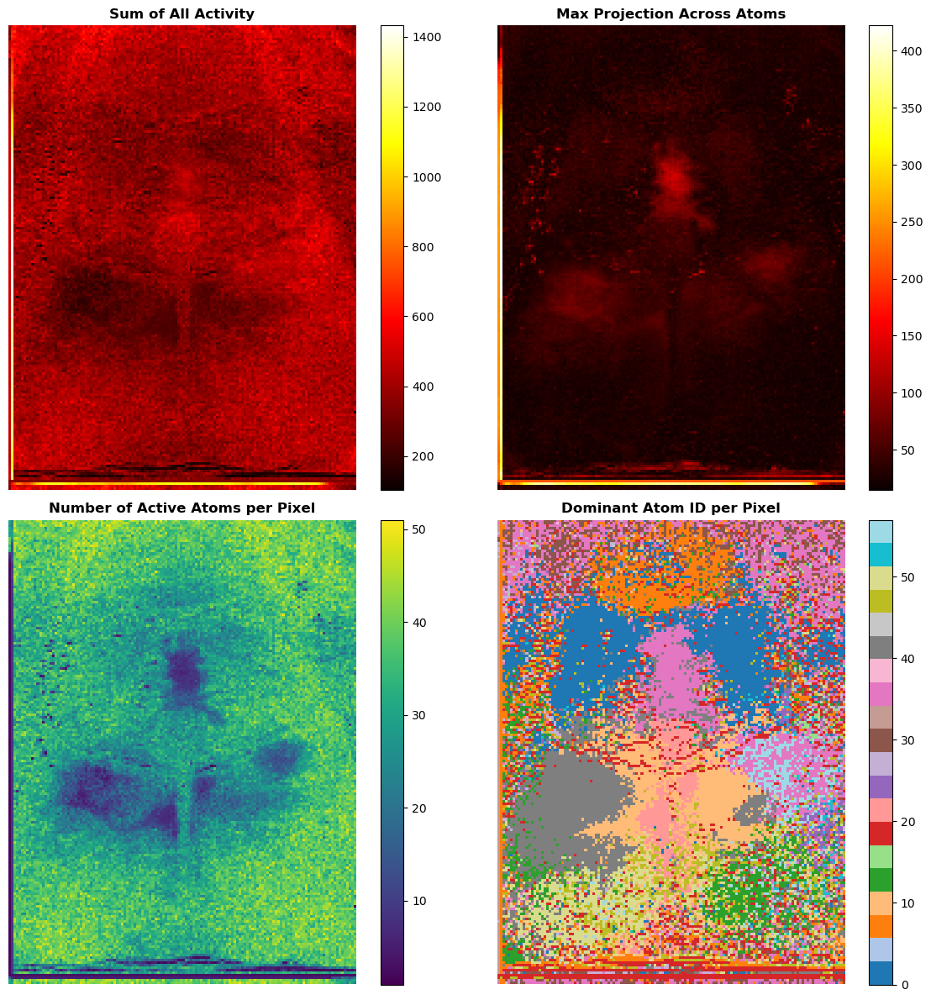

In [27]:
_= vis.create_composite_maps(S_final)

(<Figure size 1800x3000 with 116 Axes>,
 array([19, 11,  2,  7, 46, 35, 40, 41, 50, 42, 31, 37, 13, 54, 26, 21, 27,
        36, 14, 12,  8, 55, 29, 51, 48, 24, 15, 57, 23, 49,  0, 20,  3, 32,
        25, 43, 17, 34,  9, 18, 52, 45, 16,  1, 30, 28, 53, 39, 10,  4, 44,
         5, 38, 56,  6, 22]))

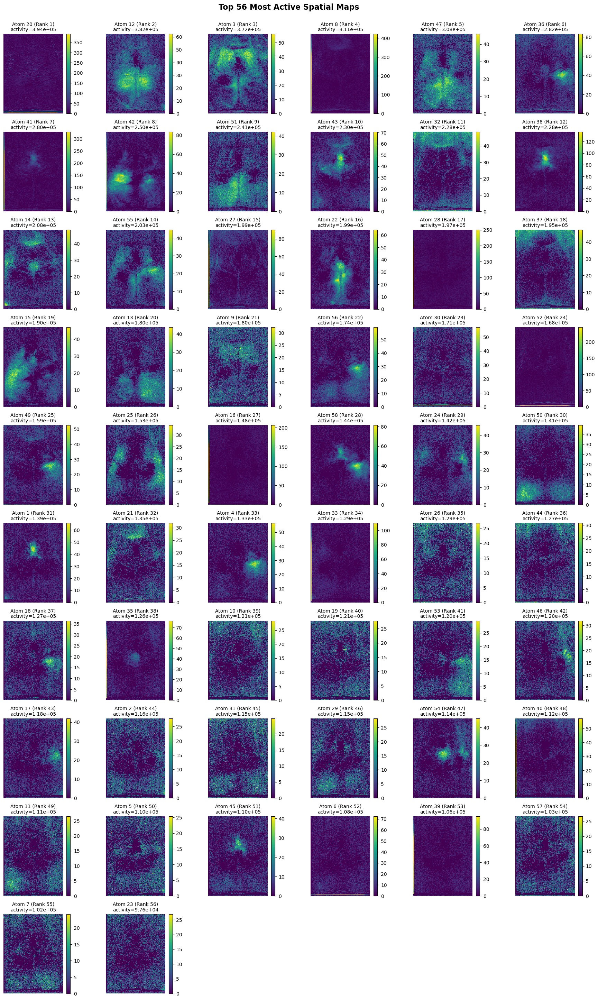

In [28]:
vis.visualize_top_atoms(S_final, n_top=int(28*2), n_cols=6)